In [1]:
%run -n cnn.py

Couldn't import dot_parser, loading of dot files will not be possible.


Using gpu device 0: Graphics Device (CNMeM is disabled, cuDNN 4007)


In [2]:
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
im = Image.open('./data/full_images/Acanthocytes_-_762601071HV_001.jpg')

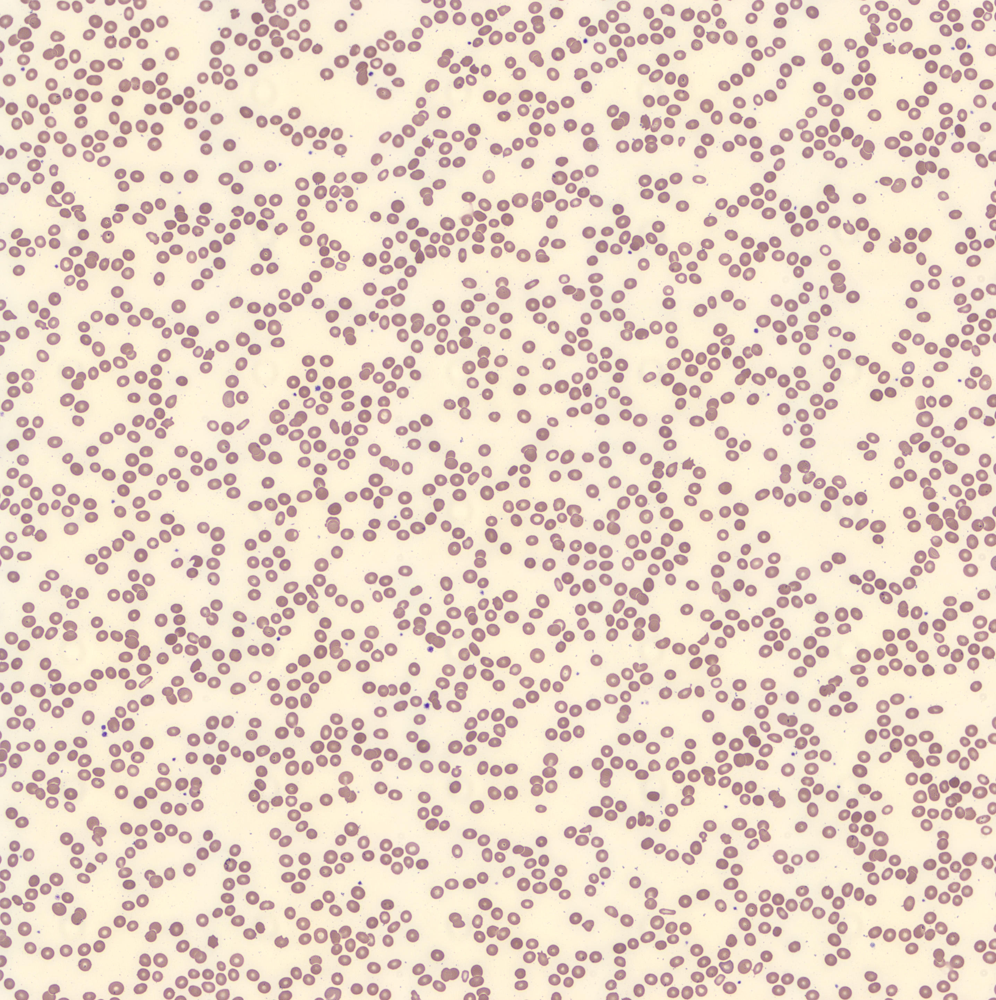

In [4]:
im

In [176]:
output_layer = build_model(IMAGE_W, IMAGE_W, NUM_CLASSES, None)
layers = lasagne.layers.get_all_layers(output_layer)

model = './output/models/september_1 epoch 175.pickle'
_ = load_parameters(output_layer, model)

Loaded network parameters from ./output/models/september_1 epoch 175.pickle


In [118]:
new_output_layer = lasagne.layers.Conv2DLayer(layers[-4], filter_size=1, num_filters=NUM_CLASSES)

In [119]:
W = output_layer.W.get_value().T[..., np.newaxis, np.newaxis]
new_output_layer.W.set_value(W)

b = output_layer.b.get_value()
new_output_layer.b.set_value(b)

In [120]:
X = T.tensor4()
output = lasagne.layers.get_output(new_output_layer, X)
f_predict = theano.function([X], output)

In [121]:
def predict(im):
    p = f_predict(np.array(im).astype('float32')[np.newaxis].transpose(0, 3, 1, 2))[0]
#    p = p - p.max(0)
#    p = np.exp(p)
#    p = p / (p.sum(0) + 1e-9)
    return p

In [122]:
p = predict(im)

In [123]:
p.shape

(10, 709, 707)

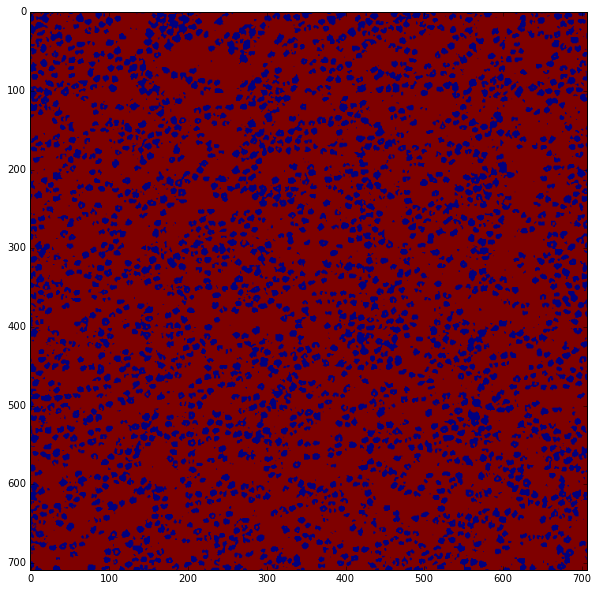

In [130]:
plt.figure(figsize=(10, 10))
plt.imshow(p.sum(0) > 50000)

In [129]:
p.sum(0).max()

69455.5

In [79]:
p

array([[[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ..., 
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ..., 
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ..., 
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       ..., 
       [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0., 

In [131]:
import cv2

In [132]:
def rbc_capture(path):
    print(path)
    im = cv2.imread(path)

    # color to gray
    imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

    # blur
    imgray = cv2.medianBlur(imgray, 5)

    # thresh image
    ret, thresh = cv2.threshold(imgray, 205, 255, 0)

    # find all contours
    image, contours, hierarchy = cv2.findContours(
        thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

    # create mask image where all elements are zero (black image) with same
    # size as source (1st param)
    mask = np.zeros(imgray.shape, np.uint8)

    coordinates = []

    # filter contours based on area
    for h, cnt in enumerate(contours):

        area = cv2.contourArea(cnt)
        if area < 300:
            continue
        if area > 2000:
            continue
        if len(cnt) < 5:
            continue

        # find coordinates for contour objects
        x, y, w, h = cv2.boundingRect(cnt)
        xywh = (x, y, w, h)
        # append coordinates to list
        coordinates.append(xywh)

        # draw contours to mask image
        cv2.drawContours(mask, [cnt], 0, 255, -1)
    # pass list and index to pandas
    coordinate_array = np.array(coordinates)
    return coordinate_array, mask

In [159]:
X = T.tensor4()
output = lasagne.layers.get_output(output_layer, X)
f_predict = theano.function([X], output)

In [257]:
fn = './data/full_images/Acanthocytes_-_762601075HV_001.jpg'
im = Image.open(fn)
cs, m = rbc_capture(fn)

./data/full_images/Acanthocytes_-_762601075HV_001.jpg


In [258]:
im = np.array(im)[..., ::-1]

In [259]:
ims = []
for x, y, w, h in cs:
    try:
        x = x + w//2
        y = y + h//2
        c = im[y-IMAGE_W//2:y+IMAGE_W//2, x-IMAGE_W//2:x+IMAGE_W//2]
        if c.shape != (IMAGE_W, IMAGE_W, 3):
            raise IndexError
        ims.append(c)
    except IndexError:
        continue

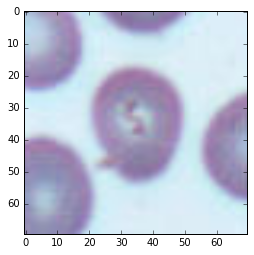

In [260]:
plt.imshow(ims[0])

In [261]:
ims = np.array(ims).transpose((0, 3, 1, 2)).astype('float32')

In [262]:
ims = ims/255. - 0.5

In [263]:
p = f_predict(ims)

In [264]:
p.shape

(2116, 10)

In [265]:
p = np.argmax(p, 1)

(array([ 1581.,    17.,    83.,    72.,    21.,     6.,    29.,    22.,
          118.,   167.]),
 array([ 0. ,  0.9,  1.8,  2.7,  3.6,  4.5,  5.4,  6.3,  7.2,  8.1,  9. ]),
 <a list of 10 Patch objects>)

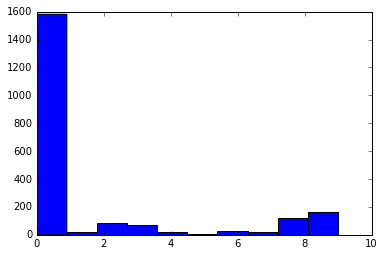

In [266]:
plt.hist(p)

In [172]:
    GROUPS = {
        'NORMAL': 0,
        'Echinocyte': 1,
        'Dacrocyte': 2,
        'Schistocyte': 3,
        'Elliptocyte': 4,
        'Acanthocyte': 5,
        'Target cell': 6,
        'Stomatocyte': 7,
        'Spherocyte': 8,
        'Overlap': 9
    }
    LABELS = {v:k for k, v in GROUPS.items()}
    

In [209]:
LABELS[2]

'Dacrocyte'

In [280]:
ix = (p==8).nonzero()

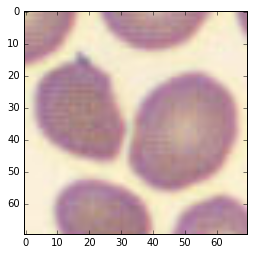

In [283]:
i = 5
plt.imshow(ims[ix][i][::-1].T+0.5)

In [207]:
ims[ix][i].shape

(3, 70, 70)